# Import libraries
Import the basic data manipulation libraries

In [1]:
import numpy as np
from numpy import log
import pandas as pd
import geopandas as gpd

Import visualisation and mapping libraries

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# For visualising data on interactive maps. Supports Image, Video, GeoJSON, TopoJSON overlays
import folium 

from bokeh.plotting import figure, show
from bokeh.tile_providers import get_provider, Vendors # tile provider is the underlying map
from bokeh.io import reset_output, output_otebook, save # to display plots inside Jupyter

reset_output()
output_notebook()

Loading BokehJS ...

# Load datasets

## Load in shapefiles and taxi zone lookup

Load the completed version of the below:

In [3]:
ZONES = pd.read_feather('./Data/TaxiZones.feather')
ZONES.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       265 non-null    object
 2   Zone          264 non-null    object
 3   service_zone  263 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


In [5]:
ZONES = pd.read_csv('./Data/taxi+_zone_lookup.csv')
ZONES

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone
...,...,...,...,...
260,261,Manhattan,World Trade Center,Yellow Zone
261,262,Manhattan,Yorkville East,Yellow Zone
262,263,Manhattan,Yorkville West,Yellow Zone
263,264,Unknown,NV,NaN


In [4]:
ZONES.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       265 non-null    object
 2   Zone          264 non-null    object
 3   service_zone  263 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


Cast to appropriate data types:

In [5]:
ZONES = ZONES.astype('category')

In [6]:
ZONES.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   LocationID    265 non-null    category
 1   Borough       265 non-null    category
 2   Zone          264 non-null    category
 3   service_zone  263 non-null    category
dtypes: category(4)
memory usage: 26.3 KB


In [6]:
ZONES.to_feather('./Data/TaxiZones.feather')

## Download data from TLC website and feather
The below code was run (in a separate notebook) to download the data from the TLC website and store it in .feather format for ease of access. There are two different `BASEURL`s where the data is located; data for each `LICENSE` type should be accessed from the respective `BASEURL` e.g. access `"fhv"` from the first URL, `"yellow"` from the second.

In [ ]:
BASEURL = ["https://nyc-tlc.s3.amazonaws.com/trip+data/$LICENSE$_tripdata_$YEAR$-$MONTH$.csv",
           "https://s3.amazonaws.com/nyc-tlc/trip+data/$LICENSE$_tripdata_$YEAR$-$MONTH$.csv"][0]
LICENSE = ["fhv", "fhvhv",
           "yellow", "green"][1]
YEAR = 2019

for month in range(2, 13):
    
    MONTH = f"{month:02}"
    source_URL = (BASEURL
                   .replace("$LICENSE$", LICENSE)
                   .replace("$YEAR$", str(YEAR))
                   .replace("$MONTH$", MONTH))
    print(f"\n\nDownloading {source_URL} ...")
    %time df = pd.read_csv(source_URL, encoding="latin1")

    
    
    feather_filename = f"{LICENSE}_tripdata_{YEAR}-{MONTH}.feather"
    file_path = "./Data/" + feather_filename
    print(f"Download complete. Now writing {feather_filename} ...")
    %time df.reset_index().to_feather(file_path)

KeyboardInterrupt: 

Download complete. Now writing fhvhv_tripdata_2019-02.feather ...


NameError: name 'df' is not defined

Note that 2020 data may be incomplete due to [extension](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page) on record submissions.

## Read feathered data into data frames

In [4]:
FILE_PATH = f"./Data/$LICENSE$_$YEAR$/$LICENSE$_tripdata_$YEAR$-$MONTH$.feather" 
MONTHS = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

In [5]:
def feather_to_df(license, year, month):
    file_path = FILE_PATH.replace("$YEAR$", year).replace("$MONTH$", month).replace("$LICENSE$", license)
    return pd.read_feather(file_path)

### For Hire Vehicle data JAN 2019

In [49]:
%%time
df_fhv_jan_19 = feather_to_df('fhv', '2019', '01')

CPU times: user 5.6 s, sys: 930 ms, total: 6.53 s
Wall time: 6.02 s


In [13]:
df_fhv_jan_19.tail()

,index,dispatching_base_num,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,SR_Flag
23130805,23130805,B03157,2019-01-31 23:21:00,2019-01-31 23:28:52,NaN,265.0,NaN
23130806,23130806,B03157,2019-01-31 23:38:04,2019-01-31 23:45:43,NaN,265.0,NaN
23130807,23130807,B03157,2019-01-31 23:53:58,2019-02-01 00:25:04,NaN,265.0,NaN
23130808,23130808,B03157,2019-01-31 23:54:53,2019-02-01 00:00:14,NaN,265.0,NaN
23130809,23130809,B03164,2019-01-31 23:55:47,2019-02-01 00:24:29,NaN,265.0,NaN


### For Hire Vehicle data FEB 2019

In [48]:
%%time
df_fhv_feb_19 = feather_to_df('fhv', '2019', '02')

KeyboardInterrupt: 

In [10]:
df_fhv_feb_19.tail()

,index,dispatching_base_num,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,SR_Flag
1706740,1706740,B03129,2019-02-28 23:55:25,2019-03-01 00:06:18,94,169,NaN
1706741,1706741,B03157,2019-02-28 23:35:26,2019-02-28 23:39:00,264,265,NaN
1706742,1706742,B03157,2019-02-28 23:13:40,2019-02-28 23:17:24,264,265,NaN
1706743,1706743,B03157,2019-02-28 23:18:45,2019-02-28 23:56:57,264,265,NaN
1706744,1706744,B03177,2019-02-28 23:45:40,2019-02-28 23:49:41,264,265,NaN


### Combine FHV JAN and FEB

In [12]:
%time df_fhv_2019 = pd.concat([df_fhv_jan_19, df_fhv_feb_19], keys=MONTHS[0:3])

CPU times: user 7.27 s, sys: 3.81 s, total: 11.1 s
Wall time: 11.1 s


index dispatching_base_num      pickup_datetime  \
Feb 1706740  1706740               B03129  2019-02-28 23:55:25   
    1706741  1706741               B03157  2019-02-28 23:35:26   
    1706742  1706742               B03157  2019-02-28 23:13:40   
    1706743  1706743               B03157  2019-02-28 23:18:45   
    1706744  1706744               B03177  2019-02-28 23:45:40   

                dropoff_datetime  PULocationID  DOLocationID  SR_Flag  
Feb 1706740  2019-03-01 00:06:18          94.0         169.0      NaN  
    1706741  2019-02-28 23:39:00         264.0         265.0      NaN  
    1706742  2019-02-28 23:17:24         264.0         265.0      NaN  
    1706743  2019-02-28 23:56:57         264.0         265.0      NaN  
    1706744  2019-02-28 23:49:41         264.0         265.0      NaN

In [14]:
df_fhv_2019.drop('index', axis=1, inplace=True)
df_fhv_2019

dispatching_base_num      pickup_datetime     dropoff_datetime  \
Jan 0                     B00001  2019-01-01 00:30:00  2019-01-01 02:51:55   
    1                     B00001  2019-01-01 00:45:00  2019-01-01 00:54:49   
    2                     B00001  2019-01-01 00:15:00  2019-01-01 00:54:52   
    3                     B00008  2019-01-01 00:19:00  2019-01-01 00:39:00   
    4                     B00008  2019-01-01 00:27:00  2019-01-01 00:37:00   
...                          ...                  ...                  ...   
Feb 1706740               B03129  2019-02-28 23:55:25  2019-03-01 00:06:18   
    1706741               B03157  2019-02-28 23:35:26  2019-02-28 23:39:00   
    1706742               B03157  2019-02-28 23:13:40  2019-02-28 23:17:24   
    1706743               B03157  2019-02-28 23:18:45  2019-02-28 23:56:57   
    1706744               B03177  2019-02-28 23:45:40  2019-02-28 23:49:41   

             PULocationID  DOLocationID  SR_Flag  
Jan 0                 NaN           NaN      NaN  
    1                 NaN           NaN      NaN  
    2                 NaN           NaN      NaN  
    3                 NaN           NaN      NaN  
    4                 NaN           NaN      NaN  
...                   ...           ...      ...  
Feb 1706740          94.0         169.0      NaN  
    1706741         264.0         265.0      NaN  
    1706742         264.0         265.0      NaN  
    1706743         264.0         265.0      NaN  
    1706744         264.0         265.0      NaN  

[24837555 rows x 6 columns]

### Codes for trying to concatenate everything in one go...

In [ ]:
YEAR = 2019
LICENSE = ["fhv", "fhvhv", "yellow", "green"][0]

df_fhv_2019 = pd.DataFrame()

for month in range(1,13):
    
    MONTH = f"{month:02}"
    file_path = f"./Data/{LICENSE}_tripdata_{YEAR}-{MONTH}.feather"
    
    df_fhv_2019.append(pd.read_feather(file_path).drop('index', axis=1))


In [37]:
def load_feather_to(df, year, license, month):
    
    file_path = f"./Data/{license.upper()}_{year}/{license}_tripdata_{year}-{month}.feather"
    
    df.concat(pd.read_feather(file_path).drop('index', axis=1))

### Read data for yellow taxi 2020

In [43]:
LICENSE = "yellow"
YEAR = "2020"

df_yellow_2020 = pd.DataFrame()

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
files = [f"./Data/{LICENSE.upper()}_{YEAR}/{LICENSE}_tripdata_{YEAR}-{month:02}.feather" for month in range(1, len(months)+1)]

%time data_frames = [pd.read_feather(file_path).drop('index', axis=1) for file_path in files]

TypeError: concat() got an unexpected keyword argument 'key'

In [ ]:
df_yellow_2020 = pd.concat(data_frames, keys=months).drop('index', axis=1).reset_index()

In [46]:
df_yellow_2020.to_feather()

,level_0,level_1,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,Jan,0,1.0,2020-01-01 00:28:15,2020-01-01 00:33:03,1.0,1.20,1.0,N,238,239,1.0,6.00,3.0,0.5,1.47,0.00,0.3,11.27,2.5
1,Jan,1,1.0,2020-01-01 00:35:39,2020-01-01 00:43:04,1.0,1.20,1.0,N,239,238,1.0,7.00,3.0,0.5,1.50,0.00,0.3,12.30,2.5
2,Jan,2,1.0,2020-01-01 00:47:41,2020-01-01 00:53:52,1.0,0.60,1.0,N,238,238,1.0,6.00,3.0,0.5,1.00,0.00,0.3,10.80,2.5
3,Jan,3,1.0,2020-01-01 00:55:23,2020-01-01 01:00:14,1.0,0.80,1.0,N,238,151,1.0,5.50,0.5,0.5,1.36,0.00,0.3,8.16,0.0
4,Jan,4,2.0,2020-01-01 00:01:58,2020-01-01 00:04:16,1.0,0.00,1.0,N,193,193,2.0,3.50,0.5,0.5,0.00,0.00,0.3,4.80,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16847773,Jun,549755,NaN,2020-06-30 23:05:00,2020-06-30 23:32:00,NaN,12.96,NaN,None,17,69,NaN,32.91,0.0,0.5,2.75,6.12,0.3,42.58,0.0
16847774,Jun,549756,NaN,2020-06-30 23:21:47,2020-06-30 23:25:24,NaN,0.36,NaN,None,41,41,NaN,11.45,0.0,0.5,2.75,0.00,0.3,15.00,0.0
16847775,Jun,549757,NaN,2020-06-30 23:34:00,2020-06-30 23:44:00,NaN,2.36,NaN,None,242,81,NaN,18.45,0.0,0.5,2.75,0.00,0.3,22.00,0.0
16847776,Jun,549758,NaN,2020-06-30 23:22:47,2020-06-30 23:42:01,NaN,5.50,NaN,None,14,118,NaN,15.90,0.0,0.5,6.23,12.24,0.3,35.17,0.0


In [48]:
df_yellow_2020.reset_index().reset_index()

,index,level_0,level_1,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,...,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,0,Jan,0,1.0,2020-01-01 00:28:15,2020-01-01 00:33:03,1.0,1.20,1.0,N,...,239,1.0,6.00,3.0,0.5,1.47,0.00,0.3,11.27,2.5
1,1,Jan,1,1.0,2020-01-01 00:35:39,2020-01-01 00:43:04,1.0,1.20,1.0,N,...,238,1.0,7.00,3.0,0.5,1.50,0.00,0.3,12.30,2.5
2,2,Jan,2,1.0,2020-01-01 00:47:41,2020-01-01 00:53:52,1.0,0.60,1.0,N,...,238,1.0,6.00,3.0,0.5,1.00,0.00,0.3,10.80,2.5
3,3,Jan,3,1.0,2020-01-01 00:55:23,2020-01-01 01:00:14,1.0,0.80,1.0,N,...,151,1.0,5.50,0.5,0.5,1.36,0.00,0.3,8.16,0.0
4,4,Jan,4,2.0,2020-01-01 00:01:58,2020-01-01 00:04:16,1.0,0.00,1.0,N,...,193,2.0,3.50,0.5,0.5,0.00,0.00,0.3,4.80,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16847773,16847773,Jun,549755,NaN,2020-06-30 23:05:00,2020-06-30 23:32:00,NaN,12.96,NaN,None,...,69,NaN,32.91,0.0,0.5,2.75,6.12,0.3,42.58,0.0
16847774,16847774,Jun,549756,NaN,2020-06-30 23:21:47,2020-06-30 23:25:24,NaN,0.36,NaN,None,...,41,NaN,11.45,0.0,0.5,2.75,0.00,0.3,15.00,0.0
16847775,16847775,Jun,549757,NaN,2020-06-30 23:34:00,2020-06-30 23:44:00,NaN,2.36,NaN,None,...,81,NaN,18.45,0.0,0.5,2.75,0.00,0.3,22.00,0.0
16847776,16847776,Jun,549758,NaN,2020-06-30 23:22:47,2020-06-30 23:42:01,NaN,5.50,NaN,None,...,118,NaN,15.90,0.0,0.5,6.23,12.24,0.3,35.17,0.0


# Preprocessing

## For Hire Vehicle using a small dataset (JAN)

### Check and Fix attribute types:

In [50]:
df_fhv_jan_19.drop('index', axis=1, inplace=True)

In [51]:
df_fhv_jan_19.dtypes

dispatching_base_num     object
pickup_datetime          object
dropoff_datetime         object
PULocationID            float64
DOLocationID            float64
SR_Flag                 float64
dtype: object

`dispatching_base_num` is a categorical attribute: the Base Base License Number that dispatched the trip.

`pickup_datetime` is a numerical attribute: the date and time of the trip pickup. However **this is currently a categorical attribute**. Similarily for `dropoff_datetime`.

`PULocationID` is a categorical attribute giving the TLC Taxi Zone of pickup. Could probably cast as an `str`, however, we **should cast it as an `int` as we will need to do joins** later. Same with `DOLocationID`.

`SR_Flag` is a categorical attribute: `1` if the ride was shared, else `null`. We should cast it to a `Bool`. 

#### Cast the `dispatching_base_num` as a category

In [54]:
# check out the raw values to see if data is clean!
unique_bases = df_fhv_jan_19['dispatching_base_num'].unique()
print(unique_bases)

['B00001' 'B00008' 'B00009' 'B00013' 'B00037' 'B00039' 'B00053' 'B00056'
 'B00111' 'B00112' 'B00131' 'B00149' 'B00160' 'B00221' 'B00225' 'B00227'
 'B00248' 'B00254' 'B00256' 'B00272' 'B00280' 'B00310' 'B00318' 'B00346'
 'B00350' 'B00445' 'B00446' 'B00448' 'B00457' 'B00459' 'B00472' 'B00477'
 'B00536' 'B00552' 'B00608' 'B00619' 'B00628' 'B00647' 'B00652' 'B00693'
 'B00706         ' 'B00756' 'B00789' 'B00821' 'B00823' 'B00837' 'B00856'
 'B00860' 'B00882' 'B00887' 'B00889         ' 'B00900' 'B00911' 'B00919'
 'B00932' 'B00937' 'B00965' 'B00972' 'B00975         ' 'B00990' 'B01048'
 'B01051' 'B01061' 'B01065' 'B01066         ' 'B01069' 'B01079' 'B01129'
 'B01145' 'B01146' 'B01148         ' 'B01176         ' 'B01196' 'B01200'
 'B01231' 'B01233         ' 'B01239' 'B01259' 'B01263' 'B01285' 'B01300'
 'B01308' 'B01315' 'B01318' 'B01332' 'B01336' 'B01338' 'B01339' 'B01340'
 'B01341' 'B01349' 'B01362' 'B01392' 'B01398' 'B01406' 'B01413' 'B01436'
 'B01437' 'B01444' 'B01445' 'B01452' 'B01455' 'B014

See that there is a `\\N` and `None` categories. Want to count the occurences of these; if there are very few, may discard them, otherwise may need to impute the value. To save space, first convert to a `category` dtype.

In [52]:
df_fhv_jan_19['dispatching_base_num'] = df_fhv_jan_19['dispatching_base_num'].astype('category')

In [61]:
df_fhv_jan_19.tail()

,dispatching_base_num,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,SR_Flag
23130805,B03157,2019-01-31 23:21:00,2019-01-31 23:28:52,NaN,265.0,NaN
23130806,B03157,2019-01-31 23:38:04,2019-01-31 23:45:43,NaN,265.0,NaN
23130807,B03157,2019-01-31 23:53:58,2019-02-01 00:25:04,NaN,265.0,NaN
23130808,B03157,2019-01-31 23:54:53,2019-02-01 00:00:14,NaN,265.0,NaN
23130809,B03164,2019-01-31 23:55:47,2019-02-01 00:24:29,NaN,265.0,NaN


In [76]:
filtered = df_fhv_jan_19.loc[df_fhv_jan_19['dispatching_base_num'].isin(['\\N', 'None'])].copy()

In [78]:
filtered

,dispatching_base_num,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,SR_Flag
20082409,\N,2019-01-28 05:29:19,2019-01-28 05:44:18,75.0,208.0,NaN
20082410,\N,2019-01-28 05:50:50,2019-01-28 06:00:19,58.0,250.0,NaN
20095339,\N,2019-01-28 06:07:15,2019-01-28 06:16:06,182.0,58.0,NaN
20095340,\N,2019-01-28 06:22:49,2019-01-28 06:47:22,208.0,167.0,NaN
20095341,\N,2019-01-28 06:50:08,2019-01-28 07:00:16,167.0,169.0,NaN
...,...,...,...,...,...,...
22826856,\N,2019-01-31 18:42:41,2019-01-31 18:54:51,237.0,230.0,2.0
22887474,\N,2019-01-31 19:06:55,2019-01-31 19:20:31,230.0,233.0,NaN
22887475,\N,2019-01-31 19:23:16,2019-01-31 20:10:19,233.0,177.0,1.0
22887476,\N,2019-01-31 19:27:42,2019-01-31 19:44:56,233.0,256.0,2.0


In [53]:
filtered.groupby('dispatching_base_num')['dispatching_base_num'].count().sort_values(ascending=False)[:3]

NameError: name 'filtered' is not defined

In [110]:
bases = df_fhv_jan_19['dispatching_base_num'].value_counts()
bases = pd.DataFrame(bases)
bases.head()

,dispatching_base_num
B02510,4623412
B02764,1662983
B02765,1059883
B02875,1009567
B02800,1004974


In [111]:
bases.describe()

,dispatching_base_num
count,6.030000e+02
mean,3.835955e+04
std,2.329632e+05
min,1.000000e+00
25%,3.150000e+02
50%,1.363000e+03
75%,4.932000e+03
max,4.623412e+06


See that the count of `\\N` is quite lower than most groups, can safely remove it. 

#### Make pickup times numeric

Checking to see that there are no dodgy values (data is clean)

In [54]:
df_fhv_jan_19[["pickup_datetime", "dropoff_datetime"]].sort_values("pickup_datetime", ascending=True)

KeyboardInterrupt: 

In [55]:
df_fhv_jan_19["pickup_datetime"] = pd.to_datetime(df_fhv_jan_19["pickup_datetime"], 
                                                 errors='raise',
                                                 yearfirst=True)

df_fhv_jan_19["dropoff_datetime"] = pd.to_datetime(df_fhv_jan_19["dropoff_datetime"], 
                                                 errors='raise',
                                                 yearfirst=True)

In [56]:
df_fhv_jan_19.dtypes

dispatching_base_num          category
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                   float64
DOLocationID                   float64
SR_Flag                        float64
dtype: object

#### Convert LocationID's to categories

In [124]:
df_fhv_jan_19.sort_values("PULocationID")

,dispatching_base_num,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,SR_Flag
14905228,B02832,2019-01-21 15:30:00,2019-01-21 16:00:00,0.0,0.0,NaN
15349229,B02832,2019-01-22 07:30:00,2019-01-22 08:00:00,0.0,0.0,NaN
4372772,B02832,2019-01-07 14:00:00,2019-01-07 14:30:00,0.0,0.0,NaN
979921,B02832,2019-01-02 12:30:00,2019-01-02 13:00:00,0.0,0.0,NaN
10257613,B02832,2019-01-15 15:30:00,2019-01-15 16:00:00,0.0,0.0,NaN
...,...,...,...,...,...,...
23130805,B03157,2019-01-31 23:21:00,2019-01-31 23:28:52,NaN,265.0,NaN
23130806,B03157,2019-01-31 23:38:04,2019-01-31 23:45:43,NaN,265.0,NaN
23130807,B03157,2019-01-31 23:53:58,2019-02-01 00:25:04,NaN,265.0,NaN
23130808,B03157,2019-01-31 23:54:53,2019-02-01 00:00:14,NaN,265.0,NaN


In [57]:
df_fhv_jan_19[['PULocationID', 'DOLocationID']] = df_fhv_jan_19[['PULocationID', 'DOLocationID']].astype('category')

In [58]:
df_fhv_jan_19.dtypes

dispatching_base_num          category
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                  category
DOLocationID                  category
SR_Flag                        float64
dtype: object

In [45]:
tbl = df_fhv_jan_19.groupby(['PULocationID'])['PULocationID'].agg(num_pickups=('PULocationID', 'size'))

In [46]:
tbl

,num_pickups
PULocationID,
0.0,215
1.0,3230
10.0,48772
100.0,156330
101.0,13987
...,...
96.0,3213
97.0,144631
98.0,16908


In [ ]:
sns.set(style='whitegrid')


#### Make shared ride boolean

In [86]:
df_fhv_jan_19['SR_Flag'] = df_fhv_jan_19['SR_Flag'].fillna(0)

In [90]:
df_fhv_jan_19['SR_Flag'] = df_fhv_jan_19['SR_Flag'].astype('int')

In [92]:
df_shared = df_fhv_jan_19.groupby('SR_Flag').agg(num_trips = ('dispatching_base_num', 'size')).reset_index()
df_shared

,SR_Flag,num_trips
0,0,17747181
1,1,2369820
2,2,1874965
3,3,749388
4,4,229875
5,5,87381
6,6,36969
7,7,16437
8,8,7843
9,9,4067


We see that shared is not just ones and zero. Make a new attribute to store the boolean value and use this instead. 

In [97]:
df_fhv_jan_19['shared_passengers'] = df_fhv_jan_19['SR_Flag']

In [99]:
df_fhv_jan_19['SR_Flag'] = df_fhv_jan_19['SR_Flag'].astype('bool')

In [102]:
df_fhv_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23130810 entries, 0 to 23130809
Data columns (total 7 columns):
 #   Column                Dtype         
---  ------                -----         
 0   dispatching_base_num  category      
 1   pickup_datetime       datetime64[ns]
 2   dropoff_datetime      datetime64[ns]
 3   PULocationID          category      
 4   DOLocationID          category      
 5   SR_Flag               bool          
 6   shared_passengers     int64         
dtypes: bool(1), category(3), datetime64[ns](2), int64(1)
memory usage: 683.9 MB


Plot the distribution of passenger numbers

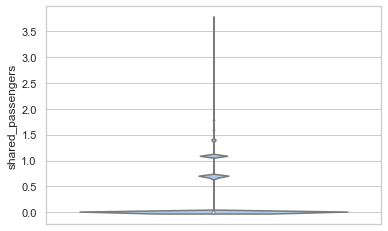

In [116]:
sns.set(style="whitegrid", palette="pastel", color_codes=True)
sns.violinplot(y=df_fhv_jan_19['shared_passengers'].apply(lambda x: log(x) if x else 0))

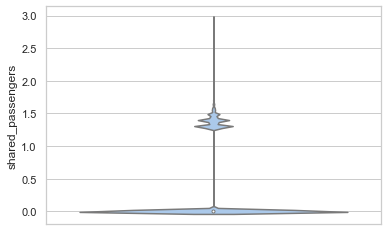

In [110]:
# sns.violinplot(y=df_fhv_jan_19['shared_passengers'].apply(lambda x: 1-1/x if x else 0))
sns.violinplot(y=df_fhv_jan_19['shared_passengers'].apply(lambda x: log(x + 9) - 1 if x else 0))

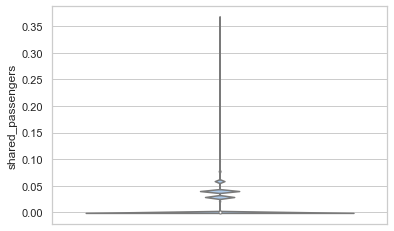

In [115]:
sns.violinplot(y=df_fhv_jan_19['shared_passengers'].apply(lambda x: log((x+100)/99) if x else 0))

## Preprocess 2019 yellow taxi

In [10]:
%%time
df_yellow_jan_19 = feather_to_df('yellow', '2019', '01').drop('index', axis=1)

CPU times: user 2.92 s, sys: 1.56 s, total: 4.49 s
Wall time: 3.47 s


In [11]:
df_yellow_jan_19

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1,2019-01-01 00:46:40,2019-01-01 00:53:20,1,1.50,1,N,151,239,1,7.0,0.5,0.5,1.65,0.0,0.3,9.95,NaN
1,1,2019-01-01 00:59:47,2019-01-01 01:18:59,1,2.60,1,N,239,246,1,14.0,0.5,0.5,1.00,0.0,0.3,16.30,NaN
2,2,2018-12-21 13:48:30,2018-12-21 13:52:40,3,0.00,1,N,236,236,1,4.5,0.5,0.5,0.00,0.0,0.3,5.80,NaN
3,2,2018-11-28 15:52:25,2018-11-28 15:55:45,5,0.00,1,N,193,193,2,3.5,0.5,0.5,0.00,0.0,0.3,7.55,NaN
4,2,2018-11-28 15:56:57,2018-11-28 15:58:33,5,0.00,2,N,193,193,2,52.0,0.0,0.5,0.00,0.0,0.3,55.55,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667787,2,2019-01-31 23:57:36,2019-02-01 00:18:39,1,4.79,1,N,263,4,1,18.0,0.5,0.5,3.86,0.0,0.3,23.16,0.0
7667788,2,2019-01-31 23:32:03,2019-01-31 23:33:11,1,0.00,1,N,193,193,1,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667789,2,2019-01-31 23:36:36,2019-01-31 23:36:40,1,0.00,1,N,264,264,1,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667790,2,2019-01-31 23:14:53,2019-01-31 23:15:20,1,0.00,1,N,264,7,1,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0


In [12]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7667792 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   VendorID               int64  
 1   tpep_pickup_datetime   object 
 2   tpep_dropoff_datetime  object 
 3   passenger_count        int64  
 4   trip_distance          float64
 5   RatecodeID             int64  
 6   store_and_fwd_flag     object 
 7   PULocationID           int64  
 8   DOLocationID           int64  
 9   payment_type           int64  
 10  fare_amount            float64
 11  extra                  float64
 12  mta_tax                float64
 13  tip_amount             float64
 14  tolls_amount           float64
 15  improvement_surcharge  float64
 16  total_amount           float64
 17  congestion_surcharge   float64
dtypes: float64(9), int64(6), object(3)
memory usage: 1.0+ GB


In [131]:
df_yellow_jan_19['VendorID'].isna().any()

False

In [132]:
df_yellow_jan_19['VendorID'].unique()

[1, 2, 4]
Categories (3, int64): [1, 2, 4]

In [13]:
df_yellow_jan_19['VendorID'] = (df_yellow_jan_19['VendorID']
                                .astype('category')
                                .cat.rename_categories({
                                    1: "Creative Mobile Technologies, LLC",
                                    2: "VeriFone Inc.",
                                    4: "Flywheel Inc."
                                }))

In [14]:
vendors = df_yellow_jan_19.groupby('VendorID').agg(n_trips=('VendorID', 'count')).reset_index()

In [15]:
vendors

,VendorID,n_trips
0,"Creative Mobile Technologies, LLC",2938778
1,VeriFone Inc.,4652191
2,Flywheel Inc.,76823


Text(0.5, 0, '# trips')

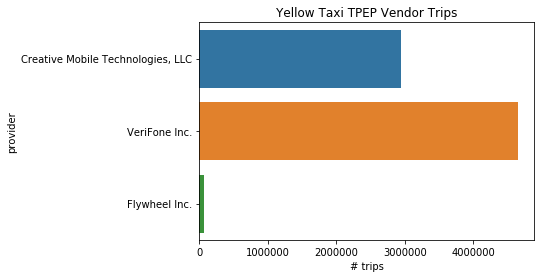

In [16]:
sns.barplot(x='n_trips', y='VendorID', data=vendors)
plt.title("Yellow Taxi TPEP Vendor Trips")
plt.ylabel("provider")
plt.xlabel("# trips")


In [19]:
df_yellow_jan_19['tpep_pickup_datetime'] = pd.to_datetime(df_yellow_jan_19['tpep_pickup_datetime'], 
                                                                                 yearfirst=True,
                                                                                errors='raise')

In [20]:
df_yellow_jan_19['tpep_dropoff_datetime'] = pd.to_datetime(df_yellow_jan_19['tpep_dropoff_datetime'], 
                                                                                 yearfirst=True,
                                                                                errors='raise')

In [137]:
df_yellow_jan_19['passenger_count'].isna().any()

False

In [21]:
df_yellow_jan_19['passenger_count'] = df_yellow_jan_19['passenger_count'].astype('int')

In [22]:
def logify(x): 
    return log(x) if x else 0

In [152]:
df_yellow_jan_19['passenger_count'].describe()

count    7.667792e+06
mean     1.567078e+00
std      1.224431e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      9.000000e+00
Name: passenger_count, dtype: float64

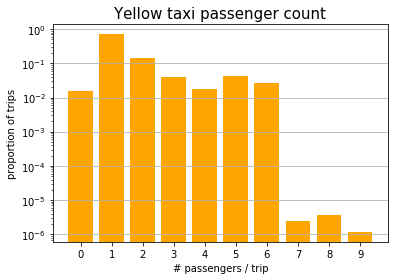

In [23]:
plt.grid(which='major', axis='y')
counts, bins, patches = plt.hist(df_yellow_jan_19['passenger_count'], 
                                 density=True, log=True, 
                                 bins=range(11), align='left', rwidth=0.8,
                                 color='orange',
                                 label=[str(i) for i in range(10)])
plt.title("Yellow taxi passenger count", fontsize=15)
plt.xlabel('# passengers / trip')
plt.ylabel('proportion of trips')
plt.xticks(range(10))
plt.show()

In [190]:
df_yellow_jan_19.loc[df_yellow_jan_19.passenger_count == 0]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,rate,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,RatecodeID
156,"Creative Mobile Technologies, LLC",2019-01-01 00:32:24,2019-01-01 00:33:21,0,5.3,standard,False,50,50,Credit Card,2.5,0.5,0.5,0.75,0.0,0.3,4.55,NaN,standard
228,"Creative Mobile Technologies, LLC",2019-01-01 00:00:50,2019-01-01 00:31:48,0,18.0,JFK,False,132,140,Credit Card,52.0,0.0,0.5,7.00,0.0,0.3,59.80,NaN,JFK
229,"Creative Mobile Technologies, LLC",2019-01-01 00:38:32,2019-01-01 01:09:51,0,8.9,standard,False,229,37,Credit Card,29.5,0.5,0.5,7.70,0.0,0.3,38.50,NaN,standard
298,"Creative Mobile Technologies, LLC",2019-01-01 00:45:19,2019-01-01 00:55:53,0,1.0,standard,False,107,170,Cash,8.0,0.5,0.5,0.00,0.0,0.3,9.30,NaN,standard
905,"Creative Mobile Technologies, LLC",2019-01-01 00:20:15,2019-01-01 00:26:42,0,0.7,standard,False,90,249,Credit Card,6.0,0.5,0.5,1.00,0.0,0.3,8.30,NaN,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667552,"Creative Mobile Technologies, LLC",2019-01-31 23:56:07,2019-02-01 00:13:46,0,2.8,standard,False,264,264,Credit Card,13.5,0.5,0.5,1.50,0.0,0.3,16.30,0.0,standard
7667581,"Creative Mobile Technologies, LLC",2019-01-31 23:36:42,2019-01-31 23:57:43,0,4.8,standard,False,161,13,Credit Card,17.5,0.5,0.5,2.00,0.0,0.3,20.80,0.0,standard
7667612,"Creative Mobile Technologies, LLC",2019-01-31 23:06:23,2019-01-31 23:18:20,0,3.2,standard,False,68,239,Credit Card,12.0,0.5,0.5,2.65,0.0,0.3,15.95,0.0,standard
7667764,"Creative Mobile Technologies, LLC",2019-01-31 23:06:51,2019-01-31 23:15:06,0,1.4,standard,False,162,186,Cash,7.5,0.5,0.5,0.00,0.0,0.3,8.80,0.0,standard


In [193]:
df_yellow_jan_19.dtypes

VendorID                       category
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
passenger_count                   int64
trip_distance                   float64
rate                           category
store_and_fwd_flag                 bool
PULocationID                   category
DOLocationID                   category
payment_type                   category
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
RatecodeID                     category
dtype: object

TypeError: Timestamp('2019-01-01 00:46:40') is not a string

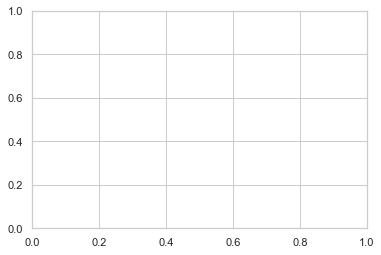

In [195]:
pd.plotting.parallel_coordinates(df_yellow_jan_19, 
                                 'rate', 
                                 col=['VendorID', 'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'total_amount'])

In [150]:
df_yellow_jan_19['trip_distance'].isna().any()

False

In [151]:
df_yellow_jan_19['trip_distance'].describe()

count    7.667792e+06
mean     2.801084e+00
std      3.737529e+00
min      0.000000e+00
25%      9.000000e-01
50%      1.530000e+00
75%      2.800000e+00
max      8.318000e+02
Name: trip_distance, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x7fadc0171ba8>,
 'caps': [<matplotlib.lines.Line2D at 0x7fadc0163358>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fadc0171a20>],
 'medians': [<matplotlib.lines.Line2D at 0x7fadc0163a58>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fadc0163dd8>],
 'means': []}

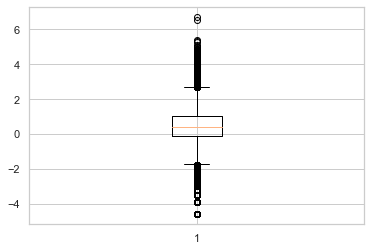

In [180]:
plt.boxplot(df_yellow_jan_19['trip_distance'].apply(lambda x: log(x) if x else 0))

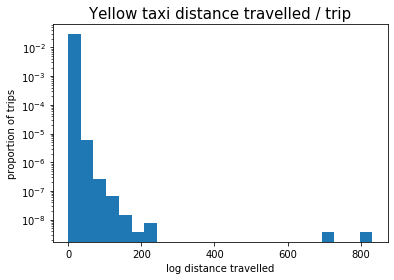

In [55]:
plt.hist(df_yellow_jan_19['trip_distance'], density=True, bins='sturges', log=True)
plt.title("Yellow taxi distance travelled / trip", fontsize=15)
plt.xlabel("log distance travelled")
plt.ylabel("proportion of trips")
plt.show()

In [25]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7667792 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               category      
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        int64         
 4   trip_distance          float64       
 5   RatecodeID             int64         
 6   store_and_fwd_flag     object        
 7   PULocationID           int64         
 8   DOLocationID           int64         
 9   payment_type           int64         
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: category(1), dateti

In [56]:
df_yellow_jan_19['RatecodeID'].unique()

array([ 1,  2,  4,  5,  3, 99,  6])

In [57]:
df_yellow_jan_19['RatecodeID'].isna().any()

False

In [26]:
df_yellow_jan_19['RatecodeID'] = (df_yellow_jan_19['RatecodeID']
                                  .astype('category')
                                  .cat.rename_categories({
                                      1: 'Standard', 
                                      2: 'JFK', 
                                      3: 'Newark',
                                      4: 'Nassau/Westchester',
                                      5: 'Negotiated', 
                                      6: 'Group', 
                                      99: 'Unknown'
                                  }))

In [185]:
ratecodes = df_yellow_jan_19.groupby('RatecodeID').agg(num_trips=('RatecodeID', 'count'))

In [186]:
ratecodes = ratecodes.reset_index()

In [187]:
ratecodes

,RatecodeID,num_trips
0,standard,7430139
1,JFK,166090
2,Newark,11801
3,Nassau/Westchester,4895
4,Negotiated,54569
5,Group,46
6,Unknown,252


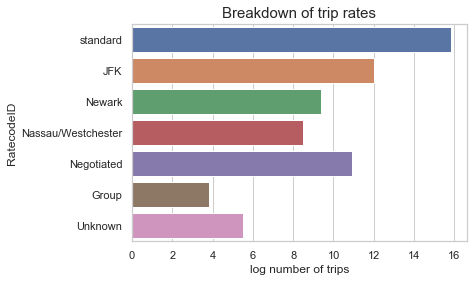

In [188]:
sns.set(style='whitegrid')
sns.barplot(x=ratecodes['num_trips'].apply(logify), y=ratecodes['RatecodeID'])
plt.xlabel('log number of trips')
plt.title('Breakdown of trip rates', fontsize=15)
plt.show()

In [27]:
df_yellow_jan_19 = df_yellow_jan_19.rename(columns={'RatecodeID': 'rate'})

In [104]:
df_yellow_jan_19['store_and_fwd_flag'].unique()

array(['N', 'Y'], dtype=object)

In [28]:
df_yellow_jan_19['store_and_fwd_flag'] = df_yellow_jan_19['store_and_fwd_flag'] == 'Y'

In [29]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7667792 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               category      
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        int64         
 4   trip_distance          float64       
 5   rate                   category      
 6   store_and_fwd_flag     bool          
 7   PULocationID           int64         
 8   DOLocationID           int64         
 9   payment_type           int64         
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: bool(1), category(2

In [30]:
df_yellow_jan_19[['PULocationID', 'DOLocationID']] = df_yellow_jan_19[['PULocationID', 'DOLocationID']].astype('category')

In [116]:
df_yellow_jan_19['DOLocationID'].isna().any()

False

In [31]:
df_yellow_jan_19['payment_type'] = df_yellow_jan_19['payment_type'].astype('category').cat.rename_categories({
    1: 'Credit Card',
    2: 'Cash',
    3: 'No charge', 
    4: 'Dispute',
    5: 'Unknown',
    6: 'Voided Trip'
})

In [32]:
payment = df_yellow_jan_19.groupby('payment_type').agg(n_trips=('payment_type', 'count'))

In [33]:
payment = payment.reset_index()

In [34]:
payment

,payment_type,n_trips
0,Credit Card,5486027
1,Cash,2137415
2,No charge,33186
3,Dispute,11164


Text(0.5, 1.0, 'Payment types')

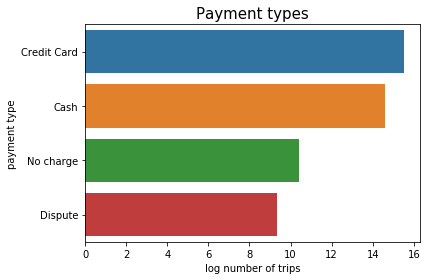

In [35]:
sns.barplot(x=payment['n_trips'].apply(logify), y=payment['payment_type'])
plt.xlabel("log number of trips")
plt.ylabel("payment type")
plt.title("Payment types", fontsize=15)

In [36]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7667792 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               category      
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        int64         
 4   trip_distance          float64       
 5   rate                   category      
 6   store_and_fwd_flag     bool          
 7   PULocationID           category      
 8   DOLocationID           category      
 9   payment_type           category      
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: bool(1), category(5

In [130]:
df_yellow_jan_19['fare_amount'].isna().any()

False

In [132]:
df_yellow_jan_19['fare_amount'].describe()

count    7.667792e+06
mean     1.240941e+01
std      2.620721e+02
min     -3.620000e+02
25%      6.000000e+00
50%      8.500000e+00
75%      1.350000e+01
max      6.232599e+05
Name: fare_amount, dtype: float64

In [150]:
df_yellow_jan_19['fare_amount'].quantile([0.99, 0.999, 0.9999, 0.99999, 0.999999])

0.990000       52.000000
0.999000       85.000000
0.999900      200.000000
0.999990      396.691733
0.999999    27124.481863
Name: fare_amount, dtype: float64

In [ ]:
%time df_yellow_jan_19.to_feather("./Data/yellow_jan_2019_dtype.feather")

In [7]:
%%time
df_yellow_jan_19 = pd.read_feather("./Data/yellow_jan_2019_dtype.feather")

CPU times: user 549 ms, sys: 1.79 s, total: 2.33 s
Wall time: 2.14 s


In [8]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7667792 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               category      
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        int64         
 4   trip_distance          float64       
 5   rate                   category      
 6   store_and_fwd_flag     bool          
 7   PULocationID           category      
 8   DOLocationID           category      
 9   payment_type           category      
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: bool(1), category(5

In [9]:
from sklearn import preprocessing

In [10]:
scaler = preprocessing.MinMaxScaler()
low_3_rates = df_yellow_jan_19[df_yellow_jan_19.rate.isin(['Unknown', 'Group', 'Nassau/Westchester'])].sample(frac=1)
high_4_rates =  df_yellow_jan_19[df_yellow_jan_19.rate.isin(['Newark', 'Negotiated', 'JFK', 'Standard'])].sample(frac=0.0001)

In [11]:
continuous3 = low_3_rates[['passenger_count', 'trip_distance', 'extra', 'mta_tax', 
                                     'tip_amount', 'tolls_amount', 'improvement_surcharge', 
                                     'congestion_surcharge', "fare_amount", "total_amount"]]
continuous4 = high_4_rates[['passenger_count', 'trip_distance', 'extra', 'mta_tax', 
                                     'tip_amount', 'tolls_amount', 'improvement_surcharge', 
                                     'congestion_surcharge', "fare_amount", "total_amount"]]

In [12]:
norm3_continuous = scaler.fit_transform(continuous3)
norm4_continuous = scaler.fit_transform(continuous4)

In [13]:
low_3_rates[['passenger_count', 'trip_distance', 'extra', 'mta_tax', 
                                     'tip_amount', 'tolls_amount', 'improvement_surcharge', 
                                     'congestion_surcharge', "fare_amount", "total_amount"]] = norm3_continuous

In [14]:
high_4_rates[['passenger_count', 'trip_distance', 'extra', 'mta_tax', 
                                     'tip_amount', 'tolls_amount', 'improvement_surcharge', 
                                     'congestion_surcharge', "fare_amount", "total_amount"]] = norm4_continuous

In [19]:
plt.rcParams['figure.figsize'] = [10, 5]

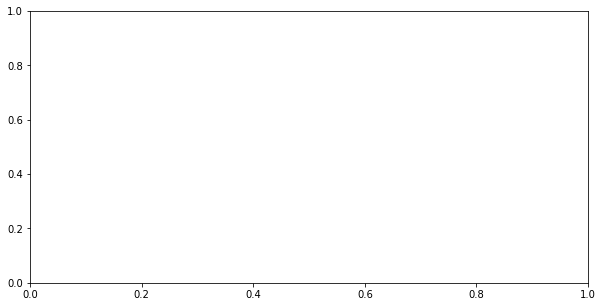

In [20]:
fig, rates_pcp_ax = plt.subplots()

In [21]:
rates_pcp_ax = pd.plotting.parallel_coordinates(pd.concat([low_3_rates, high_4_rates]), 
                                                "rate", 
                                                color=('#a2d5f2', '#40a8c4', '#ffc93c', '#d6e0f0', '#f1f3f8', '#07689f'),
                                                sort_labels=True,
                                                cols=[
                                                    'passenger_count', 'trip_distance', 'extra', 'mta_tax', 
                                                    'tip_amount', 'tolls_amount', 'improvement_surcharge', 
                                                    'congestion_surcharge', "fare_amount", "total_amount"
                                                ],
                                                ax=rates_pcp_ax
                                               )

In [23]:
labels = rates_pcp_ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='right')
rates_pcp_ax.set_title('Ratecodes', fontsize=30)
rates_pcp_ax.set(xlabel='Attribute', ylabel='Normalised Value')
rates_pcp_ax.legend(loc='center left', bbox_to_anchor=(1,1))
fig.set_size_inches((14,8))
fig.set_facecolor('white')

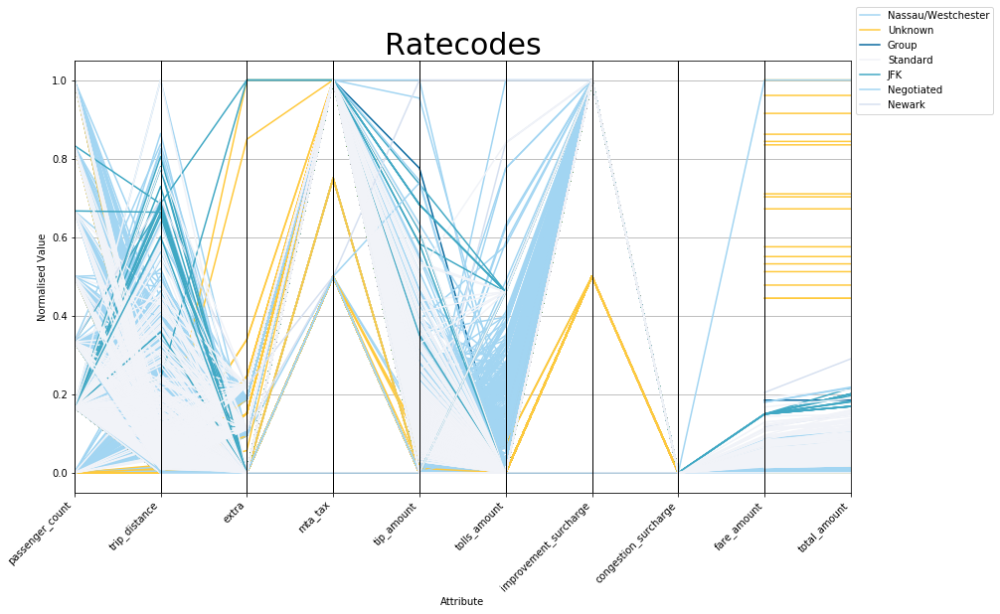

In [24]:
fig

In [30]:
fig.tight_layout()
fig.savefig("Ratecodes.png", pad=1)

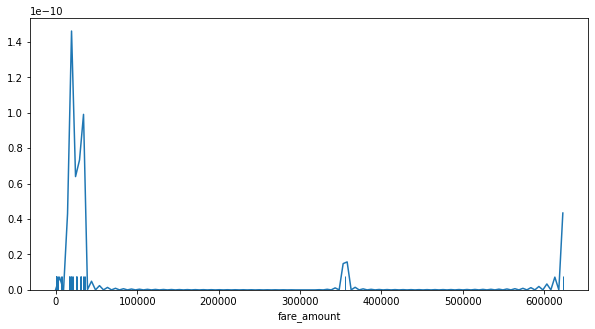

In [31]:
sns.distplot(df_yellow_jan_19['fare_amount'], hist=False, rug=True)
plt.show()

In [32]:
df_yellow_jan_19.fare_amount.quantile([.99, .999, .9999, .99999, .999999, .9999999])

0.990000        52.000000
0.999000        85.000000
0.999900       200.000000
0.999990       396.691733
0.999999     27124.481863
1.000000    418082.900457
Name: fare_amount, dtype: float64

In [33]:
df_yellow_jan_19.fare_amount

0           7.0
1          14.0
2           4.5
3           3.5
4          52.0
           ... 
7667787    18.0
7667788     0.0
7667789     0.0
7667790     0.0
7667791     0.0
Name: fare_amount, Length: 7667792, dtype: float64

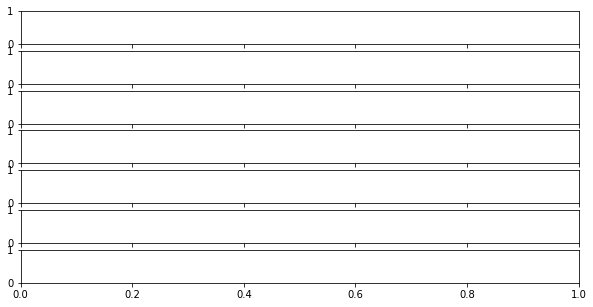

In [34]:
rate_fares_fig, rate_fares_axs = plt.subplots(nrows=len(df_yellow_jan_19.rate.unique()), sharex=True, sharey=False)

In [35]:
for i, ratecode in enumerate(df_yellow_jan_19.rate.unique()):
    df = df_yellow_jan_19[df_yellow_jan_19.rate == ratecode]
    sns.boxplot(x=df.fare_amount, ax=rate_fares_axs[i])

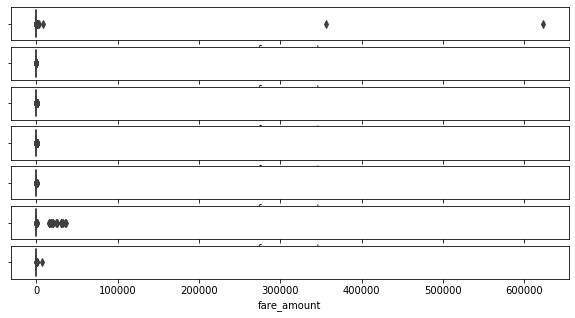

In [36]:
rate_fares_fig

In [37]:
df_yellow_jan_19.drop(df_yellow_jan_19[df_yellow_jan_19.fare_amount > df_yellow_jan_19.fare_amount.quantile(0.99999)].index, inplace=True)

In [38]:
df_yellow_jan_19

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,rate,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,"Creative Mobile Technologies, LLC",2019-01-01 00:46:40,2019-01-01 00:53:20,1,1.50,Standard,False,151,239,Credit Card,7.0,0.5,0.5,1.65,0.0,0.3,9.95,NaN
1,"Creative Mobile Technologies, LLC",2019-01-01 00:59:47,2019-01-01 01:18:59,1,2.60,Standard,False,239,246,Credit Card,14.0,0.5,0.5,1.00,0.0,0.3,16.30,NaN
2,VeriFone Inc.,2018-12-21 13:48:30,2018-12-21 13:52:40,3,0.00,Standard,False,236,236,Credit Card,4.5,0.5,0.5,0.00,0.0,0.3,5.80,NaN
3,VeriFone Inc.,2018-11-28 15:52:25,2018-11-28 15:55:45,5,0.00,Standard,False,193,193,Cash,3.5,0.5,0.5,0.00,0.0,0.3,7.55,NaN
4,VeriFone Inc.,2018-11-28 15:56:57,2018-11-28 15:58:33,5,0.00,JFK,False,193,193,Cash,52.0,0.0,0.5,0.00,0.0,0.3,55.55,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667787,VeriFone Inc.,2019-01-31 23:57:36,2019-02-01 00:18:39,1,4.79,Standard,False,263,4,Credit Card,18.0,0.5,0.5,3.86,0.0,0.3,23.16,0.0
7667788,VeriFone Inc.,2019-01-31 23:32:03,2019-01-31 23:33:11,1,0.00,Standard,False,193,193,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667789,VeriFone Inc.,2019-01-31 23:36:36,2019-01-31 23:36:40,1,0.00,Standard,False,264,264,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667790,VeriFone Inc.,2019-01-31 23:14:53,2019-01-31 23:15:20,1,0.00,Standard,False,264,7,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0


Text(0.5, 0.98, 'Ratecode Fare Amount')

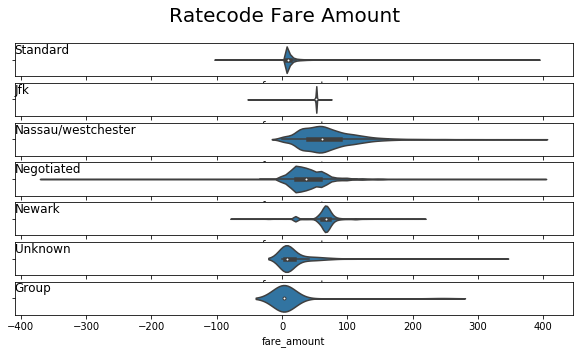

In [39]:
time

Text(0.5, 0.98, 'Ratecode Fare Amount')

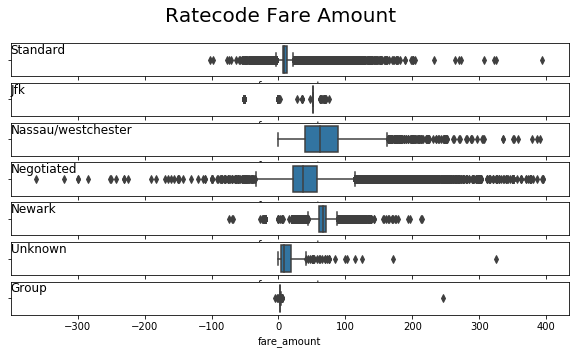

In [40]:
rate_fares_fig, rate_fares_axs = plt.subplots(nrows=len(df_yellow_jan_19.rate.unique()), sharex=True, sharey=False)
for i, ratecode in enumerate(df_yellow_jan_19.rate.unique()):
    df = df_yellow_jan_19[df_yellow_jan_19.rate == ratecode]
    sns.boxplot(x=df.fare_amount, ax=rate_fares_axs[i])
    rate_fares_axs[i].set_title(ratecode.capitalize(), loc='left', y=0.5)
rate_fares_fig.suptitle("Ratecode Fare Amount", fontsize=20)

In [41]:
for ratecode in df_yellow_jan_19.rate.unique():
    print("\n\n"+ratecode)
    fareamount=df_yellow_jan_19[df_yellow_jan_19.rate==ratecode].fare_amount
    print(fareamount.describe())
    print(fareamount.quantile([0.01, 0.99]))



Standard
count    7.430127e+06
mean     1.098658e+01
std      8.000698e+00
min     -1.030000e+02
25%      6.000000e+00
50%      8.500000e+00
75%      1.250000e+01
max      3.936700e+02
Name: fare_amount, dtype: float64
0.01     3.0
0.99    42.5
Name: fare_amount, dtype: float64


JFK
count    166090.000000
mean         51.736005
std           5.194273
min         -52.000000
25%          52.000000
50%          52.000000
75%          52.000000
max          74.860000
Name: fare_amount, dtype: float64
0.01    52.0
0.99    52.0
Name: fare_amount, dtype: float64


Nassau/Westchester
count    4888.000000
mean       68.408376
std        43.090889
min         0.000000
25%        39.000000
50%        61.500000
75%        88.500000
max       390.000000
Name: fare_amount, dtype: float64
0.01      2.500
0.99    214.325
Name: fare_amount, dtype: float64


Negotiated
count    54532.000000
mean        44.116394
std         38.692431
min       -362.000000
25%         21.030000
50%         36.030000
7

In [42]:
df_yellow_jan_19[(df_yellow_jan_19.rate=='JFK') & (df_yellow_jan_19.fare_amount != 52.0)]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,rate,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
3927,VeriFone Inc.,2019-01-01 00:22:39,2019-01-01 00:27:20,1,0.70,JFK,False,142,142,Cash,-52.0,0.0,-0.5,0.0,0.0,-0.3,-52.8,NaN
70222,VeriFone Inc.,2019-01-01 08:17:34,2019-01-01 08:17:36,1,0.00,JFK,False,48,48,Cash,0.0,0.0,0.5,0.0,0.0,0.0,0.0,NaN
70489,VeriFone Inc.,2019-01-01 08:00:48,2019-01-01 08:27:47,3,16.90,JFK,False,237,132,Dispute,-52.0,0.0,-0.5,0.0,0.0,-0.3,-52.8,NaN
79051,"Creative Mobile Technologies, LLC",2019-01-01 10:15:57,2019-01-01 10:16:31,1,0.00,JFK,False,113,113,Cash,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
79158,VeriFone Inc.,2019-01-01 10:55:23,2019-01-01 10:55:36,1,0.03,JFK,False,238,238,No charge,-52.0,0.0,-0.5,0.0,0.0,-0.3,-52.8,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7588089,VeriFone Inc.,2019-01-31 19:10:34,2019-01-31 20:15:13,1,20.83,JFK,False,143,132,Dispute,-52.0,-4.5,-0.5,0.0,0.0,-0.3,-57.3,0.0
7588738,VeriFone Inc.,2019-01-31 19:36:30,2019-01-31 19:36:38,1,0.00,JFK,False,164,164,No charge,-52.0,-4.5,-0.5,0.0,0.0,-0.3,-57.3,0.0
7595207,VeriFone Inc.,2019-01-31 18:59:59,2019-01-31 19:00:01,3,0.00,JFK,False,229,229,Dispute,-52.0,-4.5,-0.5,0.0,0.0,-0.3,-57.3,0.0
7637481,VeriFone Inc.,2019-01-31 21:42:33,2019-01-31 21:51:11,1,4.53,JFK,False,132,10,No charge,-52.0,0.0,-0.5,0.0,0.0,-0.3,-52.8,0.0


In [43]:
df_yellow_jan_19[
    (df_yellow_jan_19.fare_amount > 400)
    & (
        (df_yellow_jan_19.improvement_surcharge)
    )
].sort_values(by='fare_amount')

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,rate,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge


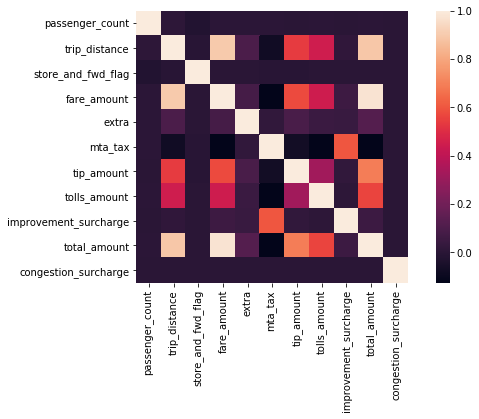

In [44]:
fig, ax = plt.subplots()
sns.heatmap(df_yellow_jan_19.corr(), ax=ax, square=True)

In [45]:
df_yellow_jan_19

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,rate,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,"Creative Mobile Technologies, LLC",2019-01-01 00:46:40,2019-01-01 00:53:20,1,1.50,Standard,False,151,239,Credit Card,7.0,0.5,0.5,1.65,0.0,0.3,9.95,NaN
1,"Creative Mobile Technologies, LLC",2019-01-01 00:59:47,2019-01-01 01:18:59,1,2.60,Standard,False,239,246,Credit Card,14.0,0.5,0.5,1.00,0.0,0.3,16.30,NaN
2,VeriFone Inc.,2018-12-21 13:48:30,2018-12-21 13:52:40,3,0.00,Standard,False,236,236,Credit Card,4.5,0.5,0.5,0.00,0.0,0.3,5.80,NaN
3,VeriFone Inc.,2018-11-28 15:52:25,2018-11-28 15:55:45,5,0.00,Standard,False,193,193,Cash,3.5,0.5,0.5,0.00,0.0,0.3,7.55,NaN
4,VeriFone Inc.,2018-11-28 15:56:57,2018-11-28 15:58:33,5,0.00,JFK,False,193,193,Cash,52.0,0.0,0.5,0.00,0.0,0.3,55.55,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667787,VeriFone Inc.,2019-01-31 23:57:36,2019-02-01 00:18:39,1,4.79,Standard,False,263,4,Credit Card,18.0,0.5,0.5,3.86,0.0,0.3,23.16,0.0
7667788,VeriFone Inc.,2019-01-31 23:32:03,2019-01-31 23:33:11,1,0.00,Standard,False,193,193,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667789,VeriFone Inc.,2019-01-31 23:36:36,2019-01-31 23:36:40,1,0.00,Standard,False,264,264,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
7667790,VeriFone Inc.,2019-01-31 23:14:53,2019-01-31 23:15:20,1,0.00,Standard,False,264,7,Credit Card,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0


In [46]:
df_yellow_jan_19.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7667715 entries, 0 to 7667791
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               category      
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        int64         
 4   trip_distance          float64       
 5   rate                   category      
 6   store_and_fwd_flag     bool          
 7   PULocationID           category      
 8   DOLocationID           category      
 9   payment_type           category      
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: bool(1), category(5

# Mapping


In [70]:
zone_polgns_gdf = gpd.read_file("./Data/taxi_zones/taxi_zones.shp")
zone_polgns_gdf.geometry = zone_polgns_gdf.geometry.to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

In [80]:
nyc_yellow_19_01_gdf.dtypes

VendorID                       category
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
passenger_count                   int64
trip_distance                   float64
rate                           category
store_and_fwd_flag                 bool
PULocationID                      int64
DOLocationID                   category
payment_type                   category
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
OBJECTID                          int64
Shape_Leng                      float64
Shape_Area                      float64
zone                             object
borough                          object
geometry                       geometry
dtype: object

In [103]:
zone_mean_fare_df = df_yellow_jan_19.groupby('PULocationID').agg(avg_totalfare=('total_amount', 'mean'))
zone_mean_fare_df = zone_mean_fare_df.reset_index()

In [104]:
zone_mean_fare_df

,PULocationID,avg_totalfare
0,1,92.783520
1,2,46.257000
2,3,33.986971
3,4,14.184153
4,5,88.128000
...,...,...
258,261,19.676631
259,262,12.582161
260,263,11.853743
261,264,15.604499


In [106]:
nyc_yellow_19_01_gdf = (
    gpd.GeoDataFrame(
        pd.merge(
            zone_mean_fare_df, zone_polgns, left_on='PULocationID', right_on='LocationID' )
    ).drop('LocationID', axis=1)
)

In [157]:
nyc_yellow_19_01_gdf['log_avg_totalfare'] = nyc_yellow_19_01_gdf['log_avg_totalfare'].apply(logify)

KeyError: 'log_avg_totalfare'

In [94]:
zones[['PULocationID', 'geometry']].drop_duplicates('PULocationID').isna().any()

PULocationID    False
geometry        False
dtype: bool

In [96]:
geoJSON = zones[['PULocationID', 'geometry']].drop_duplicates('PULocationID').to_json()

In [98]:
import json
parsed = json.loads(geoJSON)
parsed

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'PULocationID': 151},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-73.96371096499993, 40.79301293399995],
      [-73.96417598599989, 40.792362044999926],
      [-73.96525997299999, 40.792801370999946],
      [-73.96701396999998, 40.79355999099995],
      [-73.96987063299996, 40.794735204999945],
      [-73.96941543899999, 40.79536077900001],
      [-73.97073269599991, 40.79591916999994],
      [-73.97082734199991, 40.79595859999992],
      [-73.97093073199993, 40.796001047999916],
      [-73.97225661799988, 40.796560864999925],
      [-73.97365145399993, 40.79714831899989],
      [-73.97413148099994, 40.797343789],
      [-73.97507069999986, 40.797713349999924],
      [-73.97521014699981, 40.797773548],
      [-73.97539813999988, 40.797847743999945],
      [-73.97549419399992, 40.797888552],
      [-73.97563350899993, 40.79794620599995],
      [-73.97582955799997, 40.79802199699

In [153]:
nyc = folium.Map(location=(40.66, -73.94), tiles="Stamen Terrain", zoom_start=10)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(nyc)

In [154]:
folium.Choropleth(
    geo_data=geoJSON,
    name='Average Total Fare',
    data=nyc_yellow_19_01_gdf,
    columns=['PULocationID', 'avg_totalfare'],
    key_on='feature.properties.PULocationID',
    legend_name='Average total fare by pickup zone',
    fill_opacity=0.8,
    line_opacity=0.1,
    highlight=True
).add_to(nyc)

In [1]:
nyc_yellow_19_01_gdf

NameError: name 'nyc_yellow_19_01_gdf' is not defined

In [155]:
style_func = lambda x: {
    'fillColor': '#ffffff',
    'color': '#000000',
    'fillOpacity': 0.1,
    'weight': 0.1
}

ZoneName = folium.features.GeoJson(
    nyc_yellow_19_01_gdf,
    style_function=style_func,
    control=False, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=[
            'zone', 
            'PULocationID',
            'borough',
            'avg_totalfare'
        ],
        aliases=[
            'Zone Name:',
            'LocationID:',
            'Borough:',
            'Average total fare:'
        ],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)
nyc.add_child(ZoneName)
nyc.keep_in_front(ZoneName)
folium.LayerControl().add_to(nyc)

In [156]:
nyc

In [ ]:
def cat_monthly(license_dict, category, start, end):
    
    grand_df = pd.DataFrame()
    
    for month in MONTHS[start-1:end]:
        df = license_dict[month]
        puloc = (df
                 .groupby(category)
                 .agg(count=(category, 'count'))
                 .rename({'count': month}, axis=1)
                )
        grand_df = pd.concat([grand_df, puloc], axis=1).fillna(0)
        
    return grand_df